# Online Retailer Analysis using Python

Report by:  <font color=blue> Leandro Marigo
    
Date: <font color=blue> April 2023

## About the dataset  

Customer transactions data from online retailer from 2009 to 2011.  

### Atribute information:

**Invoice:** Unique identifier of a transaction which can include several different products.  
**StockCode:** Unique identifier of a product.  
**Quantity:** Quantity of product bought in a invoice/transaction.  
**InvoiceDate:** Date which an invoice / transaction took place.  
**Price:** Unit price of a product.  
**Customer:** ID / Unique identifier for a customer.    
**Country:** Country in which the invoice / transaction took place.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      Introduction
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

I have been given access to a dataset containing customer transactions for an online retailer and tasked
with using machine learning tools to gain and report on business insights. The audience for this report
are non-specialists. My main goals are:  

#### Clustering
Apply and evaluate various clustering techniques with the aim of generating actionable insights from the
data.  
● Apply at least 3 clustering algorithms to the dataset.  
● Evaluate the performance of the algorithms and make a recommendation as to which gives the
“best” results.  
● Include in my report my own interpretation of the results.  

#### Market Basket Analysis
Perform a market basket analysis of the transaction data.  
● Include in my report a comparison and evaluation of at least two algorithms.  

Research and summarise an application of market basket analysis that is not transaction data.  


**The report is structured in the different sections as outlined below:**  
    1. Exploratory Data Analysis  
    2. Data Cleaning / Feature Engineering  
    3. Data Visualization / Further EDA   
    4. RFM Segmentation   
    5. DBSCAN before Preprocessing    
    6. Log Transform    
        <u>**Clustering**</u>   
    7. DBSCAN after Preprocessing   
    8. KMeans  
    9. Hierarchical Clustering    
        <u>**Market Basket Analysis**</u>    
    10. MBA - Apriori  
    11. MBA - FP-Growt  
    12. A little bit about an MBA model that is not used on transaction data      
    13. Bibliography  </span>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      1. Exploratory Data Analysis
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

Importing and reading the two sheets from the dataset.

In [2]:
df1 = pd.read_excel("data.xlsx", 0)

In [3]:
df2 = pd.read_excel("data.xlsx", 1)

In [4]:
df1.shape

(525461, 8)

In [5]:
df2.shape

(541910, 8)

In [6]:
df1.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom


In [7]:
df2.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


Concatenating both dfs / sheets into one data frame.

In [8]:
df = pd.concat([df1, df2])

In [9]:
df.shape

(1067371, 8)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1067371 entries, 0 to 541909
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   Invoice      1067371 non-null  object        
 1   StockCode    1067371 non-null  object        
 2   Description  1062989 non-null  object        
 3   Quantity     1067371 non-null  int64         
 4   InvoiceDate  1067371 non-null  datetime64[ns]
 5   Price        1067371 non-null  float64       
 6   Customer ID  824364 non-null   float64       
 7   Country      1067371 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 73.3+ MB


In [11]:
pd.set_option('display.float_format', '{:.2f}'.format)
df.describe()

,Quantity,Price,Customer ID
count,1067371.00,1067371.00,824364.00
mean,9.94,4.65,15324.64
std,172.71,123.55,1697.46
min,-80995.00,-53594.36,12346.00
25%,1.00,1.25,13975.00
50%,3.00,2.10,15255.00
75%,10.00,4.15,16797.00
max,80995.00,38970.00,18287.00


In [12]:
df.describe(include=object)

,Invoice,StockCode,Description,Country
count,1067371,1067371,1062989,1067371
unique,53628,5305,5698,43
top,537434,85123A,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
freq,1350,5829,5918,981330


**Checking for missing values.**  

There are missing values in the features "Description" and "Customer ID"

In [13]:
df.isnull().sum()

Invoice             0
StockCode           0
Description      4382
Quantity            0
InvoiceDate         0
Price               0
Customer ID    243007
Country             0
dtype: int64

**Checking for duplicated date**  

We can see that there's 34,335 duplicate rows in the dataset that must be deleted.

In [14]:
df.duplicated().sum()

34335

**Using dataprep.eda to gather more statitical insights about the data**

100%|##########| 3/3 [00:00<?, ?it/s]

  0%|          | 0/431 [00:00<?, ?it/s]


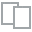
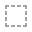
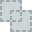
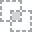
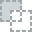
...
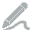
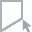
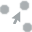
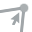
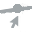

In [15]:
from dataprep.eda import plot, plot_correlation, create_report, plot_missing
plot(df)

# Observations of EDA

**Dataprep.eda**  provides a broad overview for Exploratory Data Analysis  

- We can see immediately the distribution of all the Features to give an insight of how to approach cleaning and Feature Selection  
- All features are skewed, there are missing values and duplicate data that will be handled in the data cleaning phase.
- In the column "Quantity" there are several records with a negative number, and a few negative numbers in the column "Price". Both columns will be further investigated.

**Describe, shape and info**   shows an overall structure and statistical metrics of the dataset  

- Data type variables:
    - Object = 4 variables
    - int64 = 1 variable
    - datetime64[ns] = 1 variable
    - float64 = 2 variables  
    
**Missing values**  

- Missing values identified in columns Description and Customer ID and will be handled at later stage during data cleaning.    

As the goal will be to form clusters containing valuable information about the transactions, customers and products bought, some of the variables won't be useful for this purpose as they do not add information and are not corelated with the group of data that will form the different clusters. These variables will be dropped:

- **Either Description or StockCode:** As they represent the same information (Product) in different formats. I will decide later after more investigation which one to drop.   


<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      2. Data Cleaning / Feature Engineering
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

**Removing duplicates**

In [16]:
df.drop_duplicates(inplace=True)

In [17]:
df.duplicated().sum()

0

As previously mentioned I will drop the column "Description" as this won't add information to the model. I have chosen to drop the column "Description" because it contains the same information as the column "StockCode" however it contains missing values. This column can always go back based on the Stock Code which will be mantained.

In relation to the column "InvoiceDate" I will transform it further on with the goal of reducing the amount of observations for applying the clustering model.

**Dropping columns**

In [18]:
to_drop = ["Description"]

In [19]:
df.drop(to_drop, inplace=True, axis=1)

In [20]:
df.head()

,Invoice,StockCode,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,12,2009-12-01 07:45:00,6.95,13085.00,United Kingdom
1,489434,79323P,12,2009-12-01 07:45:00,6.75,13085.00,United Kingdom
2,489434,79323W,12,2009-12-01 07:45:00,6.75,13085.00,United Kingdom
3,489434,22041,48,2009-12-01 07:45:00,2.10,13085.00,United Kingdom
4,489434,21232,24,2009-12-01 07:45:00,1.25,13085.00,United Kingdom


In [21]:
df.isnull().sum()

Invoice             0
StockCode           0
Quantity            0
InvoiceDate         0
Price               0
Customer ID    235151
Country             0
dtype: int64

I will also drop the missing values in the Customer ID column.

In [22]:
df = df.dropna(axis = 0)

In [23]:
df.isnull().sum()

Invoice        0
StockCode      0
Quantity       0
InvoiceDate    0
Price          0
Customer ID    0
Country        0
dtype: int64

### Feature engineering

I will transform the column "InvoiceDate" which is a timeseries dtype into only Year and integer dtype with the goal of reducing the amount of observations for the model and also facilitate data visuals for transactions per year.

I will also check for the first and last dates of invoice.

In [24]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
print("Minimum Invoice Date", min(df["InvoiceDate"]))
print("Maximum Invoice Date", max(df["InvoiceDate"]))

Minimum Invoice Date 2009-12-01 07:45:00
Maximum Invoice Date 2011-12-09 12:50:00


I will add a new column calculating Total Sales by multiplying the price to quantity.

In [25]:
df["Total_Sales"] = df["Price"]*df["Quantity"]

I will also add a new column with the Year of the transaction/invoice.

In [26]:
df['Year'] = df['InvoiceDate'].dt.year

In [27]:
df.head()

,Invoice,StockCode,Quantity,InvoiceDate,Price,Customer ID,Country,Total_Sales,Year
0,489434,85048,12,2009-12-01 07:45:00,6.95,13085.00,United Kingdom,83.40,2009
1,489434,79323P,12,2009-12-01 07:45:00,6.75,13085.00,United Kingdom,81.00,2009
2,489434,79323W,12,2009-12-01 07:45:00,6.75,13085.00,United Kingdom,81.00,2009
3,489434,22041,48,2009-12-01 07:45:00,2.10,13085.00,United Kingdom,100.80,2009
4,489434,21232,24,2009-12-01 07:45:00,1.25,13085.00,United Kingdom,30.00,2009


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 797885 entries, 0 to 541909
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Invoice      797885 non-null  object        
 1   StockCode    797885 non-null  object        
 2   Quantity     797885 non-null  int64         
 3   InvoiceDate  797885 non-null  datetime64[ns]
 4   Price        797885 non-null  float64       
 5   Customer ID  797885 non-null  float64       
 6   Country      797885 non-null  object        
 7   Total_Sales  797885 non-null  float64       
 8   Year         797885 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int64(2), object(3)
memory usage: 60.9+ MB


In [29]:
df.shape

(797885, 9)

**For columns quantity and price I assume negative numbers are errors and therefore I will keep only positive numbers in the dataset**

**Transforming negative numbers into NaN to drop**

In [30]:
df[df['Price'] < 0] = np.nan

In [31]:
df[df['Quantity'] < 0] = np.nan

In [32]:
df.isnull().sum()

Invoice        18390
StockCode      18390
Quantity       18390
InvoiceDate    18390
Price          18390
Customer ID    18390
Country        18390
Total_Sales    18390
Year           18390
dtype: int64

**Dropping negative numbers (NaN values)**

In [33]:
data_df = df.dropna(axis = 0)

In [34]:
data_df.isnull().sum()

Invoice        0
StockCode      0
Quantity       0
InvoiceDate    0
Price          0
Customer ID    0
Country        0
Total_Sales    0
Year           0
dtype: int64

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      3. Data Visualization / Further EDA
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

**I will visualize again the columns Price and Quantity to check if the adjustments to keep only positive figures worked**

array([[<AxesSubplot:title={'center':'Price'}>]], dtype=object)

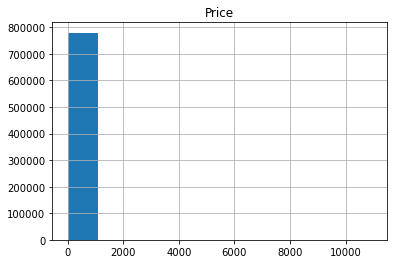

In [35]:
data_df.hist(column="Price")

array([[<AxesSubplot:title={'center':'Quantity'}>]], dtype=object)

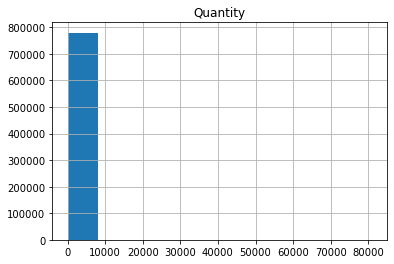

In [36]:
data_df.hist(column="Quantity")

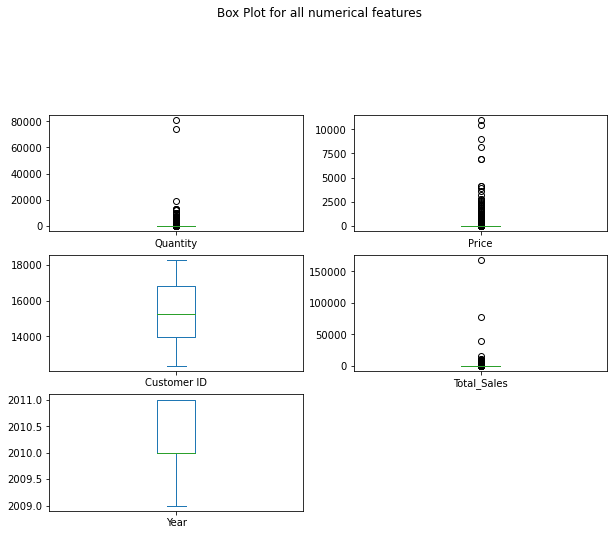

In [37]:
data_df.plot(kind='box', subplots=True, layout=(6,2), sharex=False, sharey=False, figsize=(10,15), 
              title='Box Plot for all numerical features')
plt.show()

There are outliers in columns "Price", "Quantity" and consequently "Total Sales" but for the purpose of clustering I will treat them as natural variations and therefore they will be important for the model and interpretation of the results.

In [38]:
data_df.describe(include=object)

,Invoice,StockCode,Country
count,779495,779495,779495
unique,36975,4631,41
top,576339,85123A,United Kingdom
freq,542,5023,700434


In [39]:
customer_country = data_df.groupby("Country")["Customer ID"].count()

Text(0, 0.5, 'Customer ID')

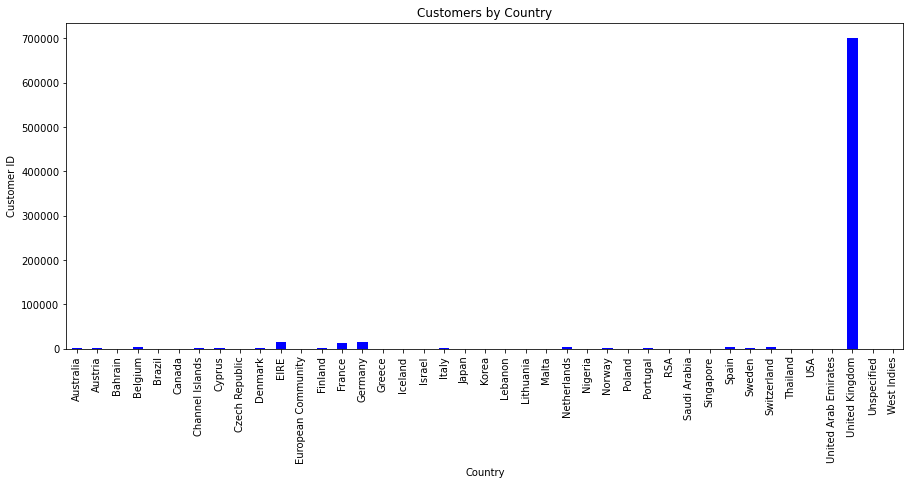

In [40]:
plt.figure(figsize=(15,6))
customer_country.plot.bar(title='Customers by Country', color='blue')
plt.xlabel('Country')
plt.ylabel('Customer ID')

In [41]:
sales_country = data_df.groupby("Country")["Total_Sales"].sum()

Text(0, 0.5, 'Total_Sales')

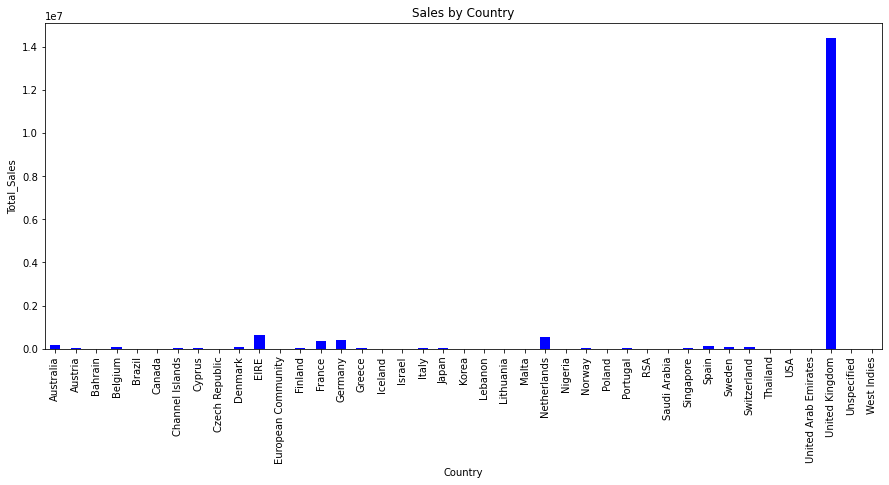

In [42]:
plt.figure(figsize=(15,6))
sales_country.plot.bar(title='Sales by Country', color='blue')
plt.xlabel('Country')
plt.ylabel('Total_Sales')

It's observed that the majority of customers and sales are concentrated in the UK.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      4. RFM Segmentation
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In order to apply the clustering model and segment the customers I will use the RFM model to calculate new variables that will help understand how recently a customer has bought in the shop, how frequently they've engaged with the shop and how much money they've spent. RFM is a data modeling method is mainly used in the marketing fields to segment customers and better target marketing campaigns and strategies. The model is built using three key factors:
    

        1. how recently a customer has transacted with a brand
        2. how frequently they’ve engaged with a brand
        3. how much money they’ve spent on a brand’s products and services

Delval, F. (2021). What is RFM Analysis? [online] ActionIQ. Available at: https://www.actioniq.com/blog/what-is-rfm-analysis/.


For this I will define the ‘reference date’, that will be the last date within the data and taking 1 year prior to the selected date for recency calculation.

In [43]:
reference_date = data_df["InvoiceDate"].max()
print("Reference Date:", reference_date)

start_date = reference_date - pd.DateOffset(days = 365)
print("Start Date:", start_date)

Reference Date: 2011-12-09 12:50:00
Start Date: 2010-12-09 12:50:00


In [44]:
df_rfm = data_df[data_df.InvoiceDate >= start_date].groupby(['Customer ID'], as_index=False).agg({'InvoiceDate': lambda x: (
reference_date - x.max()).days, 'Invoice' : 'count', 'Total_Sales' : 'sum'}).rename(columns = {'InvoiceDate' : 'Recency',
                                                                'Invoice' : 'Frequency', 'Total_Sales' : 'Spend'})
df_rfm.head()

,Customer ID,Recency,Frequency,Spend
0,12346.00,325,1,77183.60
1,12347.00,1,151,3598.21
2,12348.00,74,31,1797.24
3,12349.00,18,73,1757.55
4,12350.00,309,17,334.40


In [45]:
df_rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4270 entries, 0 to 4269
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Customer ID  4270 non-null   float64
 1   Recency      4270 non-null   int64  
 2   Frequency    4270 non-null   int64  
 3   Spend        4270 non-null   float64
dtypes: float64(2), int64(2)
memory usage: 133.6 KB


In [46]:
df_rfm = df_rfm.astype({'Customer ID':'int'})

In [47]:
df_rfm = df_rfm.astype({'Spend':'int'})

Before scaling the data I will employ DBSCAN clustering which works well with high density and sparse data.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      5. DBSCAN before Preprocessing
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In [48]:
from sklearn.cluster import DBSCAN

In [49]:
dbscan = DBSCAN()

In [50]:
dbscan.fit(df_rfm)

DBSCAN()

In [51]:
dbscan.labels_

array([-1, -1, -1, ..., -1, -1, -1], dtype=int64)

Plotting a few scatter plots to understand the distribution of the data / clusters

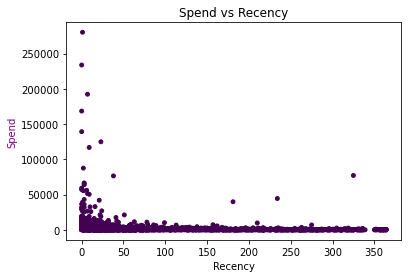

In [52]:
plt.scatter(df_rfm['Recency'], df_rfm['Spend'], c=dbscan.labels_, s=15)
plt.xlabel("Recency",color="black")
plt.ylabel("Spend",color="purple")
plt.title("Spend vs Recency",color="black")
plt.show()

I will fine tune the model trying to find the optimal epsolon

In [53]:
from sklearn.neighbors import NearestNeighbors

In [54]:
nn = NearestNeighbors(n_neighbors = 10)

neighbors = nn.fit(df_rfm)

In [55]:
distances, indices = neighbors.kneighbors(df_rfm)

In [56]:
distances

array([[    0.        ,  3750.15439682, 11396.44699018, ...,
        20760.15479229, 21302.61962764, 21739.4909324 ],
       [    0.        ,    80.02499609,    95.82797086, ...,
          282.40042493,   282.91164699,   321.59291037],
       [    0.        ,    80.62877898,   102.72779565, ...,
          144.07636864,   154.21089456,   180.28033725],
       ...,
       [    0.        ,    23.62202362,    29.563491  , ...,
          109.86355174,   113.80246043,   127.1337878 ],
       [    0.        ,   342.44999635,   441.50084938, ...,
          635.47934664,   641.72112323,   643.28687224],
       [    0.        ,    79.88742079,    87.57282684, ...,
          203.96323198,   245.06529742,   254.40322325]])

In [57]:
distances = np.sort(distances, axis=0)

In [58]:
distances = distances[:, 1]

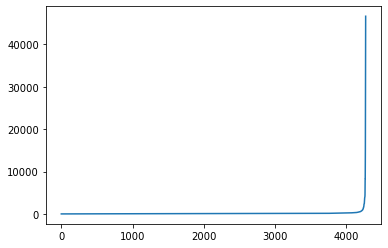

In [59]:
plt.plot(distances)

By looking at the graph it won't be possible to identify the optimal epsolon and I will need to scale and log transform the data before proceeding with the model.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      6. Log Transform
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

Checking the distribution of each column.

array([[<AxesSubplot:title={'center':'Recency'}>]], dtype=object)

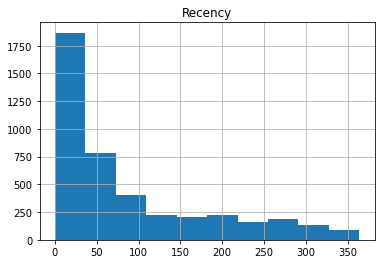

In [60]:
df_rfm.hist(column="Recency")

array([[<AxesSubplot:title={'center':'Frequency'}>]], dtype=object)

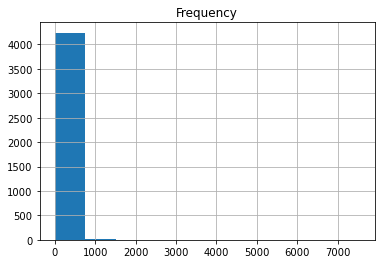

In [61]:
df_rfm.hist(column="Frequency")

array([[<AxesSubplot:title={'center':'Spend'}>]], dtype=object)

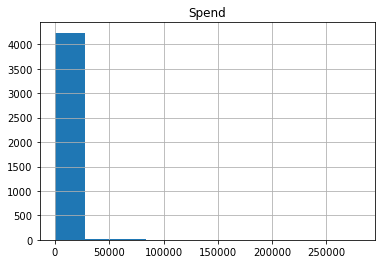

In [62]:
df_rfm.hist(column="Spend")

All variables are highly skewed and therefore I will apply log transformation to reduce skewness.

In [63]:
df_rfm["log_Recency"] = np.log(df_rfm.Recency)
df_rfm["log_Frequency"] = np.log(df_rfm.Frequency)
df_rfm["log_Spend"] = np.log(df_rfm.Spend)

C:\Users\leand\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\leand\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [64]:
log_rfm_df = df_rfm[np.isfinite(df_rfm).all(1)]

In [65]:
log_df = log_rfm_df[['log_Recency', 'log_Frequency', 'log_Spend']]

<AxesSubplot:xlabel='log_Recency', ylabel='Density'>

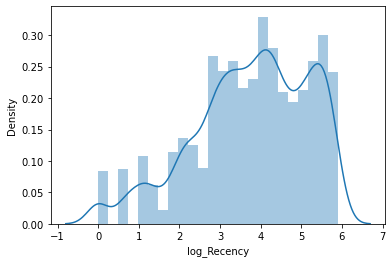

In [66]:
sns.distplot(log_df['log_Recency'])

<AxesSubplot:xlabel='log_Frequency', ylabel='Density'>

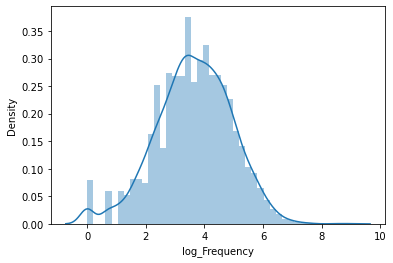

In [67]:
sns.distplot(log_df['log_Frequency'])

<AxesSubplot:xlabel='log_Spend', ylabel='Density'>

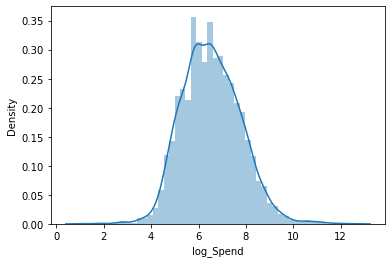

In [68]:
sns.distplot(log_df['log_Spend'])

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      7. DBSCAN after Preprocessing
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In [69]:
dbscan = DBSCAN()

In [70]:
dbscan.fit(log_df)

DBSCAN()

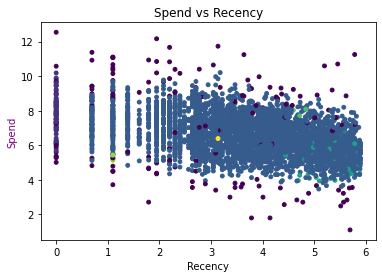

In [71]:
plt.scatter(log_df['log_Recency'], log_df['log_Spend'], c=dbscan.labels_, s=15)
plt.xlabel("Recency",color="black")
plt.ylabel("Spend",color="purple")
plt.title("Spend vs Recency",color="black")
plt.show()

I will fine tune the model trying to find the optimal epsolon

In [72]:
nn = NearestNeighbors(n_neighbors = 20)

neighbors = nn.fit(log_df)

In [73]:
distances, indices = neighbors.kneighbors(log_df)

In [74]:
distances = np.sort(distances, axis=0)

In [75]:
distances = distances[:, 1]

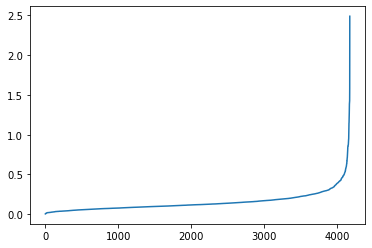

In [76]:
plt.plot(distances)

In [77]:
dbscan = DBSCAN(eps=0.4)

In [78]:
dbscan.fit(log_df)

DBSCAN(eps=0.4)

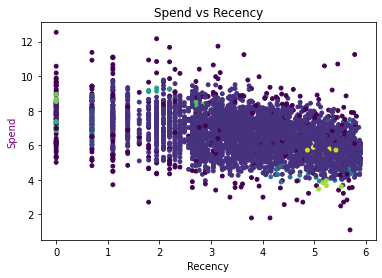

In [79]:
plt.scatter(log_df['log_Recency'], log_df['log_Spend'], c=dbscan.labels_, s=15)
plt.xlabel("Recency",color="black")
plt.ylabel("Spend",color="purple")
plt.title("Spend vs Recency",color="black")
plt.show()

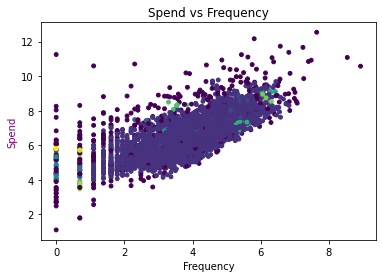

In [80]:
plt.scatter(log_df['log_Frequency'], log_df['log_Spend'], c=dbscan.labels_, s=15)
plt.xlabel("Frequency",color="black")
plt.ylabel("Spend",color="purple")
plt.title("Spend vs Frequency",color="black")
plt.show()

The clusters will be better visualized on the Spend vs Frequency graph as those seems to have higher and positive correlation.

In [101]:
def dbscan_plot(eps, min_pts):
    dbscan = DBSCAN(eps=eps, min_samples=min_pts)
    dbscan.fit(log_df)
    plt.scatter(log_df['log_Frequency'], log_df['log_Spend'], c=dbscan.labels_, s=15)

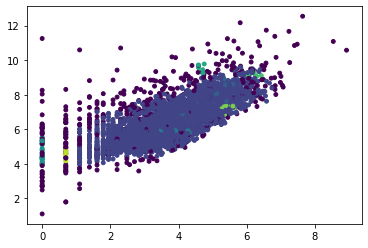

In [120]:
dbscan_plot(0.4, 6)

It is observed that the DBSCAN algorithm is not generating a good result on clustering even when applying the k-nearest neighbour to identify the optimal epsolon.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      8. KMeans
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In [81]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

### Finding the optimal number of clusters using the Elbow method

One way of measurement is <b>Within Cluster Sum of Squares (WCSS)</b>, which measures the squared average distance of all the points within a cluster to the cluster centroid. To calculate WCSS, you first find the Euclidean distance between a given point and the centroid to which it is assigned.

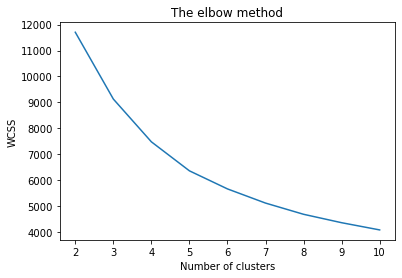

In [82]:
# Finding the optimum number of clusters for k-means classification
from sklearn.cluster import KMeans
wcss = []                  # Declare an array

# Set the loop from the minimum and maximum values
for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, max_iter = 300, n_init = 10, random_state = 0)
                                                                                    
    kmeans.fit(log_df)                                                                   
    wcss.append(kmeans.inertia_)                                                    
# inertia_float: Sum of squared distances of samples to their closest cluster center.

# Plotting the results onto a line graph, allowing us to observe 'The elbow'
plt.plot(range(2, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')    # within cluster sum of squares
plt.show()

From the graph above we can observe that the elbow occurs between 4 and 5 clusters and therefore I will select 4 clusters to start and test the model.

In [83]:
# Applying KMeans to the dataset/ Creating the kmeans classifier
kmeans4 = KMeans(n_clusters = 4, max_iter = 300, n_init = 10, random_state = 0)

# n_initint, default = 10, Number of time the k-means algorithm will be run with different centroid seeds. 
# The final results will be the best output of n_init consecutive runs in terms of inertia.
y_kmeans4 = kmeans4.fit_predict(log_df)

In [84]:
y_kmeans4

array([3, 2, 3, ..., 0, 2, 3])

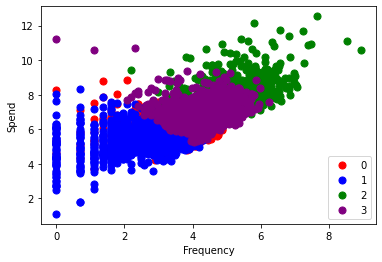

In [85]:
plt.scatter(
    log_df[y_kmeans4 == 0].log_Frequency,
    log_df[y_kmeans4 == 0].log_Spend,
    s = 50,
    c='red',
    label = '0'
)

plt.scatter(
    log_df[y_kmeans4 == 1].log_Frequency,
    log_df[y_kmeans4 == 1].log_Spend,
    s = 50,
    c='blue',
    label = '1'
)

plt.scatter(
    log_df[y_kmeans4 == 2].log_Frequency,
    log_df[y_kmeans4 == 2].log_Spend,
    s = 50,
    c='green',
    label = '2'
)

plt.scatter(
    log_df[y_kmeans4 == 3].log_Frequency,
    log_df[y_kmeans4 == 3].log_Spend,
    s = 50,
    c='purple',
    label = '3'
)


plt.legend(loc='best')
plt.xlabel('Frequency')
plt.ylabel('Spend');

It seems that clusters 0, 1 and 3 overlap in the middle of the chart, I will reduce the number of clusters to 3 and plot the graph again.

In [88]:
kmeans3 = KMeans(n_clusters = 3, max_iter = 300, n_init = 10, random_state = 0)
y_kmeans3 = kmeans3.fit_predict(log_df)

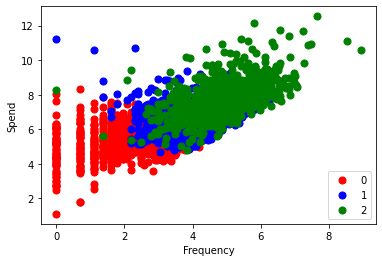

In [89]:
plt.scatter(
    log_df[y_kmeans3 == 0].log_Frequency,
    log_df[y_kmeans3 == 0].log_Spend,
    s = 50,
    c='red',
    label = '0'
)

plt.scatter(
    log_df[y_kmeans3 == 1].log_Frequency,
    log_df[y_kmeans3 == 1].log_Spend,
    s = 50,
    c='blue',
    label = '1'
)

plt.scatter(
    log_df[y_kmeans3 == 2].log_Frequency,
    log_df[y_kmeans3 == 2].log_Spend,
    s = 50,
    c='green',
    label = '2'
)

plt.legend(loc='best')
plt.xlabel('Frequency')
plt.ylabel('Spend');

### Finding the optimal number of clusters using the Silhoutte score

**I will also apply the Silhouette score to identify the best number of clusters.**

The silhouette score or coefficient is a measure of the compactness and separation of the clusters, the higher the coefficient the better is the performance of the model. (Bhardwaj, 2020)

In [90]:
def silhouette(x, n_clusters):
    for num in range(2, n_clusters):
        kmeans = KMeans(n_clusters = num, max_iter=300, n_init=10, random_state=0)
        y_kmeans = kmeans.fit_predict(log_df)
        print(f'Silhouette score for {num} clusters: {silhouette_score(log_df, y_kmeans)}')

In [91]:
silhouette(log_df, 6)

Silhouette score for 2 clusters: 0.3887184098818414
Silhouette score for 3 clusters: 0.29566486430152034
Silhouette score for 4 clusters: 0.3048814847450165
Silhouette score for 5 clusters: 0.27968522975664106


I Will also try visualizing 2 clusters as that is the highest score in the Silhouette coefficient.

In [92]:
kmeans2 = KMeans(n_clusters = 2, max_iter = 300, n_init = 10, random_state = 0)
y_kmeans2 = kmeans2.fit_predict(log_df)

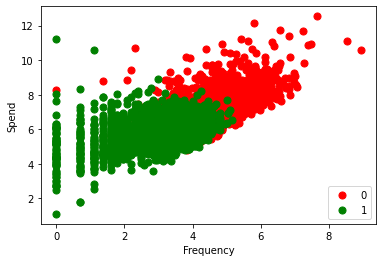

In [93]:
plt.scatter(
    log_df[y_kmeans2 == 0].log_Frequency,
    log_df[y_kmeans2 == 0].log_Spend,
    s = 50,
    c='red',
    label = '0'
)

plt.scatter(
    log_df[y_kmeans2 == 1].log_Frequency,
    log_df[y_kmeans2 == 1].log_Spend,
    s = 50,
    c='green',
    label = '1'
)


plt.legend(loc='best')
plt.xlabel('Frequency')
plt.ylabel('Spend');

The best visuals is the 3 clusters where I can identify high and low spend customers vs their frequency in the shop. So I will plot a better visuals for the 3 different clusters using KMeans.

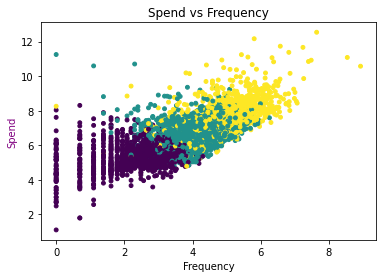

In [100]:
plt.scatter(log_df['log_Frequency'], log_df['log_Spend'], c=y_kmeans3, s=15)
plt.xlabel("Frequency",color="black")
plt.ylabel("Spend",color="purple")
plt.title("Spend vs Frequency",color="black")
plt.show()

I can immediately see that Cluster 0 (purple) represents customers with low spend and frequency, Cluster 1 (green) represents the average customer with average spend and frequency and Cluster 2 (yellow) are the Premium customers with high spend and frequency.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      9. Hierarchical Clustering
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In [121]:
import scipy.cluster.hierarchy as sch

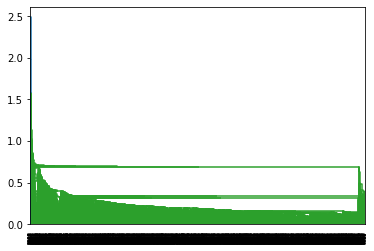

In [122]:
dendro = sch.dendrogram(sch.linkage(log_df, method='single'))

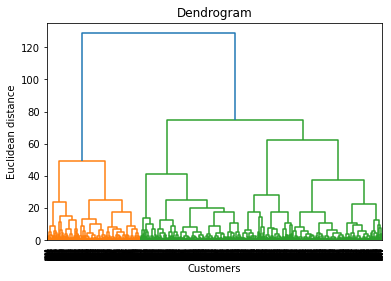

In [123]:
dendrogrm = sch.dendrogram(sch.linkage(log_df, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distance')
plt.show()

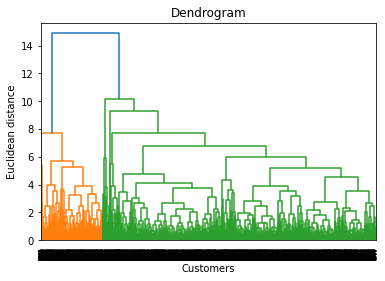

In [124]:
dendrogrm = sch.dendrogram(sch.linkage(log_df, method = 'complete'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distance')
plt.show()

Ward seems to be the method giving the best visuals and I will see how the 3 clusters are splitted using the ward method.

In [126]:
log_df.head()

,log_Recency,log_Frequency,log_Spend
0,5.78,0.00,11.25
1,0.00,5.02,8.19
2,4.30,3.43,7.49
3,2.89,4.29,7.47
4,5.73,2.83,5.81


I will store Frequency and Spend into the X variable to apply in the model.

In [127]:
X = log_df.iloc[:, [1, 2]].values 

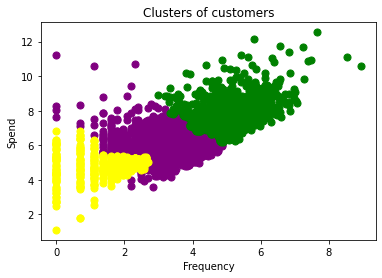

In [128]:
# import the library for Agglomerative clustering
from sklearn.cluster import AgglomerativeClustering

# Initialise an object 'hc' by calling a method 'AgglomerativeClustering'
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')

# Train the model by calling a method 'fit_predict(X)'
y_hc = hc.fit_predict(X)

# Visualising the clusters
plt.scatter(X[y_hc == 0, 0], X[y_hc == 0, 1], s = 50, c = 'purple')
plt.scatter(X[y_hc == 1, 0], X[y_hc == 1, 1], s = 50, c = 'green')
plt.scatter(X[y_hc == 2, 0], X[y_hc == 2, 1], s = 50, c = 'yellow')

plt.title('Clusters of customers')
plt.xlabel('Frequency')
plt.ylabel('Spend')
#plt.legend()
plt.show()

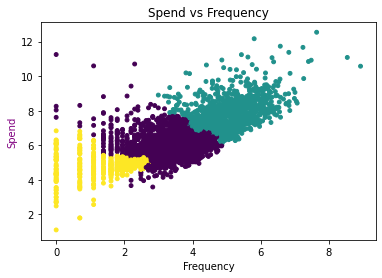

In [129]:
plt.scatter(log_df['log_Frequency'], log_df['log_Spend'], c=y_hc, s=15)
plt.xlabel("Frequency",color="black")
plt.ylabel("Spend",color="purple")
plt.title("Spend vs Frequency",color="black")
plt.show()

**Hierarchical clustering got similar results to Kmeans with a better distinction with no overlaps across the points. I can see imediately that the Yellow cluster represents customers with low spend and frequency, purple represents the average customer with a few points captured as high spend and the green cluster are the premium customers with high spend and frequency. Based on that I can develop different marketing strategies based on the different types of customers.**

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      10. MBA - Apriori
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

For the Market Basket Analysis model I will use the original dataframe and do some changes / cleaning prior to implementing the models.

In [166]:
from mlxtend.frequent_patterns import apriori, association_rules, fpgrowth

In [132]:
df_full = pd.concat([df1, df2])

In [133]:
df_full.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.00,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.00,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.00,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.00,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.00,United Kingdom


In [135]:
df_full.isnull().sum()

Invoice             0
StockCode           0
Description      4382
Quantity            0
InvoiceDate         0
Price               0
Customer ID    243007
Country             0
dtype: int64

In [137]:
df_full.duplicated().sum()

34335

Dropping duplicates

In [138]:
df_full.drop_duplicates(inplace=True)
print(df_full.duplicated().sum())

0


Dropping missing values

In [139]:
df_full = df_full.dropna(axis = 0)

In [140]:
df_full.isnull().sum()

Invoice        0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
Price          0
Customer ID    0
Country        0
dtype: int64

I will also drop negative amounts in columns "Quantity" and "Price"

In [141]:
df_full[df_full['Price'] < 0] = np.nan

In [142]:
df_full[df_full['Quantity'] < 0] = np.nan

In [143]:
df_full.isnull().sum()

Invoice        18390
StockCode      18390
Description    18390
Quantity       18390
InvoiceDate    18390
Price          18390
Customer ID    18390
Country        18390
dtype: int64

In [144]:
df_mba = df_full.dropna(axis = 0)

I will look at the quantity per country.

In [145]:
sales_country = df_mba.groupby("Country")["Quantity"].sum()

<AxesSubplot:ylabel='Quantity'>

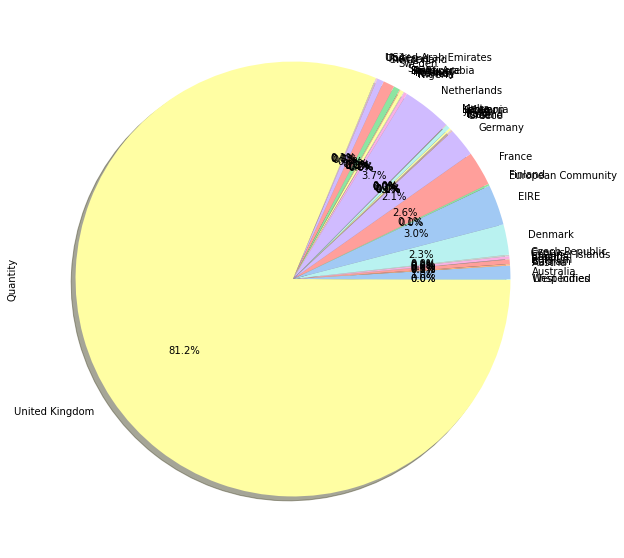

In [151]:
sales_country.plot.pie(autopct='%1.1f%%', shadow=True, figsize=(10,10), colors=sns.color_palette('pastel'))

Text(0, 0.5, 'Quantity')

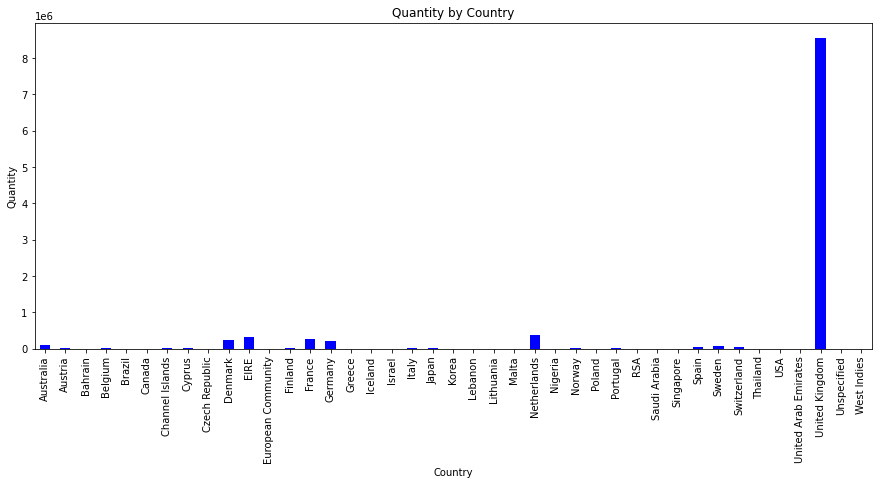

In [146]:
plt.figure(figsize=(15,6))
sales_country.plot.bar(title='Quantity by Country', color='blue')
plt.xlabel('Country')
plt.ylabel('Quantity')

As the UK represents 81.2% I will implement MBA on the UK products only.

In [152]:
mba_UK = (df_mba[df_mba['Country'] =="United Kingdom"]
          .groupby(['Invoice', 'Description'])['Quantity']
          .sum().unstack().reset_index().fillna(0)
          .set_index('Invoice'))

### Encoding for MBA

I will use one hot encoding to generate the appropriate data prior to running the algorithm.

In [157]:
def hot_encode(x):
    if(x<= 0):
        return 0
    if(x>= 1):
        return 1

In [158]:
mba_UK_enc = mba_UK.applymap(hot_encode)
mba_UK = mba_UK_enc

In [164]:
frequent_itemsets_ap = apriori(mba_UK, min_support = 0.02, use_colnames = True)

C:\Users\leand\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:111: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


In [175]:
rules_ap = association_rules(frequent_itemsets_ap, metric = "lift", min_threshold = 1)
rules_ap = rules_ap.sort_values(['confidence', 'lift'], ascending =[False, False])

In [176]:
rules_ap.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
12,(RED HANGING HEART T-LIGHT HOLDER),(WHITE HANGING HEART T-LIGHT HOLDER),0.05,0.14,0.03,0.71,5.04,0.03,2.92
15,(SWEETHEART CERAMIC TRINKET BOX),(STRAWBERRY CERAMIC TRINKET BOX),0.03,0.05,0.02,0.69,13.95,0.02,3.06
16,(WOODEN PICTURE FRAME WHITE FINISH),(WOODEN FRAME ANTIQUE WHITE ),0.05,0.05,0.03,0.60,11.77,0.03,2.39
17,(WOODEN FRAME ANTIQUE WHITE ),(WOODEN PICTURE FRAME WHITE FINISH),0.05,0.05,0.03,0.57,11.77,0.03,2.19
3,(LOVE BUILDING BLOCK WORD),(HOME BUILDING BLOCK WORD),0.04,0.05,0.02,0.53,10.02,0.02,2.01


<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      11. MBA - FP-Growth
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In [167]:
frequent_items2 = fpgrowth(mba_UK, min_support=0.02, use_colnames=True)

C:\Users\leand\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:111: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


In [168]:
frequent_items2.head()

,support,itemsets
0,0.05,(STRAWBERRY CERAMIC TRINKET BOX)
1,0.07,(ASSORTED COLOUR BIRD ORNAMENT)
2,0.05,(HOME BUILDING BLOCK WORD)
3,0.04,(LOVE BUILDING BLOCK WORD)
4,0.04,(SCOTTIE DOG HOT WATER BOTTLE)


In [173]:
rules2 = association_rules(frequent_items2, metric="lift", min_threshold=1)
rules2 = rules2.sort_values(['confidence', 'lift'], ascending =[False, False])

In [174]:
rules2.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
4,(RED HANGING HEART T-LIGHT HOLDER),(WHITE HANGING HEART T-LIGHT HOLDER),0.05,0.14,0.03,0.71,5.04,0.03,2.92
7,(SWEETHEART CERAMIC TRINKET BOX),(STRAWBERRY CERAMIC TRINKET BOX),0.03,0.05,0.02,0.69,13.95,0.02,3.06
10,(WOODEN PICTURE FRAME WHITE FINISH),(WOODEN FRAME ANTIQUE WHITE ),0.05,0.05,0.03,0.60,11.77,0.03,2.39
11,(WOODEN FRAME ANTIQUE WHITE ),(WOODEN PICTURE FRAME WHITE FINISH),0.05,0.05,0.03,0.57,11.77,0.03,2.19
1,(LOVE BUILDING BLOCK WORD),(HOME BUILDING BLOCK WORD),0.04,0.05,0.02,0.53,10.02,0.02,2.01


MBA Results: The two algorithms (Apriori and FP-Growth) performed exactly the same.

## Interpretation of the MBA results

In the UK customers tend to buy more frequently items for their homes such as "Hanging Holders" in different collors, "Ceramic Trinket Boxes" in different formats and colors, "Wooden picture frames" in different colors and types, and many other home items.  

By looking at the metrics, the probability of customers buying these products together varies between 71% and 53% from the highest to lowest, the highest being after customers buying the "RED HANGING HEART T-LIGHT HOLDER" there's a 71% probability they will also buy the "WHITE HANGING HEART T-LIGHT HOLDER", and the lowest being after customers buying the "LOVE BUILDING BLOCK WORD" there's a 53% probability they will also buy the "HOME BUILDING BLOCK WORD". Based on Lift and Leverage all items have a small depedency however looking at conviction and that metric being higher than 1 it means the products are indenpendet altough they have a high probability of being bought together.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      12. Other types of MBA applications used in different Industries
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

The Market Basket Analysis algorithms are well known for data mining and association rules mainly in the retail sector in order to identify associated products that are normally bought together. However the MBA machine learning algorithms can also be used in other areas such as Finance, Manufacturing, Pharmaceutical, Customer Behaviour, Medicine and Telecom by basically implementing its association rules to help with identifying, predicting or detecting any kind of trend for each individual industry goals. (Chaudhary, n.d.)

Other examples of Market Basket Analysis outside of the retail industry is the recomendation engines used in the streaming aplications such as Netflix, Amazon, and Spotify, which uses MBA to make association rules and recommend what to watch or listen based on prior behaviour. MBA can also be used in the Pharmaceutical industry specifically for Adverse Drug Events (ADEs) where the "transactions" in this case will be the reports of ADEs, the items/products are the drugs taken, as well as other information like symptoms. MBA will simply use association rules to identify patterns of co-occurence in the reports and provide insights about what drugs and symptoms go together to prevent and make right drug recommendations for each case. --> Based on the research (Marketing, 2019)  

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      13. Bibliograpgy
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

### Reference list

**Bhardwaj, A. (2020).** Silhouette Coefficient : Validating clustering techniques. [online] Medium. Available at: https://towardsdatascience.com/silhouette-coefficient-validating-clustering-techniques-e976bb81d10c.  

**Çankaya, M.F. (2022).** How To Normalize Your Unsupervised Data For Clustering Methods. [online] Medium. Available at: https://engineering.teknasyon.com/how-to-normalize-your-unsupervised-data-for-clustering-methods-9389298d20d5.  

**Chaudhary, S. (n.d.).** Understanding Market Basket Analysis in Data Mining. [online] www.turing.com. Available at: https://www.turing.com/kb/market-basket-analysis.  

**Delval, F. (2021).** What is RFM Analysis? [online] ActionIQ. Available at: https://www.actioniq.com/blog/what-is-rfm-analysis/.  

**Frost, J. (2019).** Guidelines for Removing and Handling Outliers in Data - Statistics by Jim. [online] Statistics by Jim. Available at: https://statisticsbyjim.com/basics/remove-outliers/ [Accessed 28 Dec. 2022].  

**Marketing, S. (2019).** Use Market Basket Analysis for More Than Market Baskets. [online] Syntelli Solutions Inc. Available at: https://www.syntelli.com/use-market-basket-analysis-for-more-than-market-baskets [Accessed 15 Apr. 2023].  

**Metcalf, L. and Casey, W. (2016).** Cybersecurity and applied mathematics. Amsterdam: Elsevier.  

**Müller, A.C. and Guido, S. (2017).** Introduction to machine learning with Python : a guide for data scientists. Beijing: O’reilly.  

**Rink, K. (2021).** Four mistakes in Clustering you should avoid. [online] Medium. Available at: https://towardsdatascience.com/common-mistakes-in-cluster-analysis-and-how-to-avoid-them-eb960116d773.  

**Vanderplas, J.T. (2017).** Python data science handbook : essential tools for working with data. Beijing Etc.: O’reilly, Cop.  

**Verma, Y. (2021).** Why Data Scaling is important in Machine Learning & How to effectively do it. [online] Analytics India Magazine. Available at: https://analyticsindiamag.com/why-data-scaling-is-important-in-machine-learning-how-to-effectively-do-it/.  